# Import Data

In [20]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime, timedelta
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True)
from sklearn import preprocessing

## Reading the Dataset

In [21]:
df = pd.read_csv('weatherAUS.csv')

In [22]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [23]:
df.tail()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
145455,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
145456,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
145457,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
145458,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No
145459,2017-06-25,Uluru,14.9,NaN,0.0,NaN,NaN,NaN,NaN,ESE,...,62.0,36.0,1020.2,1017.9,8.0,8.0,15.0,20.9,No,NaN


In [24]:
#mengidentifikasi nilai yang hilang serta tipe data dalam DataFrame.
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

Dataset tersebut memiliki 22 column, 7 tipe data object atau string dan 15 tipe data float64 

In [25]:
#mengidentikasi baris dan kolom pada dataset
df.shape

(145460, 23)

Memiliki 145460 baris dan 23 kolom

In [26]:
#mengidentifikasi dan menghitung duplikat pada dataset
df.duplicated().sum()

0

In [27]:
#Mengelompok data sesuai kelompoknya
category = ['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']
numerical = ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']

In [28]:
#Mengubah tipe data string menjadi category
df['Date'] = df['Date'].astype('category')
df['Location'] = df['Location'].astype('category')
df['WindGustDir'] = df['WindGustDir'].astype('category')
df['WindDir9am'] = df['WindDir9am'].astype('category')
df['WindDir3pm'] = df['WindDir3pm'].astype('category')
df['RainToday'] = df['RainToday'].astype('category')
df['RainTomorrow'] = df['RainTomorrow'].astype('category')
df.dtypes

Date             category
Location         category
MinTemp           float64
MaxTemp           float64
Rainfall          float64
Evaporation       float64
Sunshine          float64
WindGustDir      category
WindGustSpeed     float64
WindDir9am       category
WindDir3pm       category
WindSpeed9am      float64
WindSpeed3pm      float64
Humidity9am       float64
Humidity3pm       float64
Pressure9am       float64
Pressure3pm       float64
Cloud9am          float64
Cloud3pm          float64
Temp9am           float64
Temp3pm           float64
RainToday        category
RainTomorrow     category
dtype: object

In [29]:
#Check kelompok numerik
df_num = df.select_dtypes(include = ['float64'])
df_num.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
0,13.4,22.9,0.6,NaN,NaN,44.0,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8
1,7.4,25.1,0.0,NaN,NaN,44.0,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3
2,12.9,25.7,0.0,NaN,NaN,46.0,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2
3,9.2,28.0,0.0,NaN,NaN,24.0,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5
4,17.5,32.3,1.0,NaN,NaN,41.0,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7


In [30]:
#Check kelompok category
df_cat = df.select_dtypes(include = ['category'])
df_cat.head()

,Date,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,W,W,WNW,No,No
1,2008-12-02,Albury,WNW,NNW,WSW,No,No
2,2008-12-03,Albury,WSW,W,WSW,No,No
3,2008-12-04,Albury,NE,SE,E,No,No
4,2008-12-05,Albury,W,ENE,NW,No,No


In [31]:
# Mengidentifikasi jumlah entri (count), rata-rata (mean), standar deviasi (std), nilai minimum, kuartil pertama (25%), median (50%), kuartil ketiga (75%), dan nilai maksimum.
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,143975.000000,144199.000000,142199.000000,82670.000000,75625.000000,135197.000000,143693.000000,142398.000000,142806.000000,140953.000000,130395.00000,130432.000000,89572.000000,86102.000000,143693.000000,141851.00000
mean,12.194034,23.221348,2.360918,5.468232,7.611178,40.035230,14.043426,18.662657,68.880831,51.539116,1017.64994,1015.255889,4.447461,4.509930,16.990631,21.68339
std,6.398495,7.119049,8.478060,4.193704,3.785483,13.607062,8.915375,8.809800,19.029164,20.795902,7.10653,7.037414,2.887159,2.720357,6.488753,6.93665
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.50000,977.100000,0.000000,0.000000,-7.200000,-5.40000
25%,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.90000,1010.400000,1.000000,2.000000,12.300000,16.60000
50%,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.60000,1015.200000,5.000000,5.000000,16.700000,21.10000
75%,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.40000,1020.000000,7.000000,7.000000,21.600000,26.40000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.00000,1039.600000,9.000000,9.000000,40.200000,46.70000


## Missing Values

In [32]:
# Mengidentifikasi jumlah nilai yang hilang (missing values) 
df_mv = pd.DataFrame(df.isna().sum()).reset_index()

In [33]:
df_mv.columns = ['Features','Missing Values']
df_mv

,Features,Missing Values
0,Date,0
1,Location,0
2,MinTemp,1485
3,MaxTemp,1261
4,Rainfall,3261
5,Evaporation,62790
6,Sunshine,69835
7,WindGustDir,10326
8,WindGustSpeed,10263
9,WindDir9am,10566


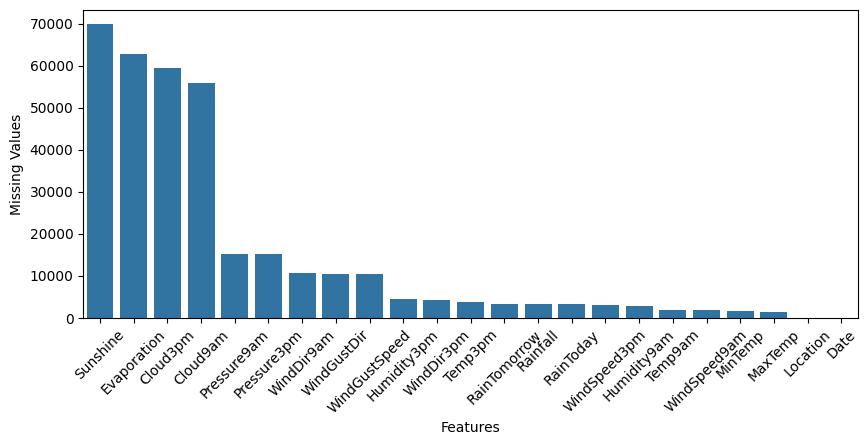

In [34]:
# Melihat jumlah nilai yang hilang (missing values) melalui bar plot
fig, ax = plt.subplots(1,1,figsize=(10,4))
sns.barplot(data = df_mv.sort_values(by='Missing Values', ascending=False), x='Features', y='Missing Values',ax=ax)

ax.tick_params(axis='x', labelrotation=45)

<Axes: >

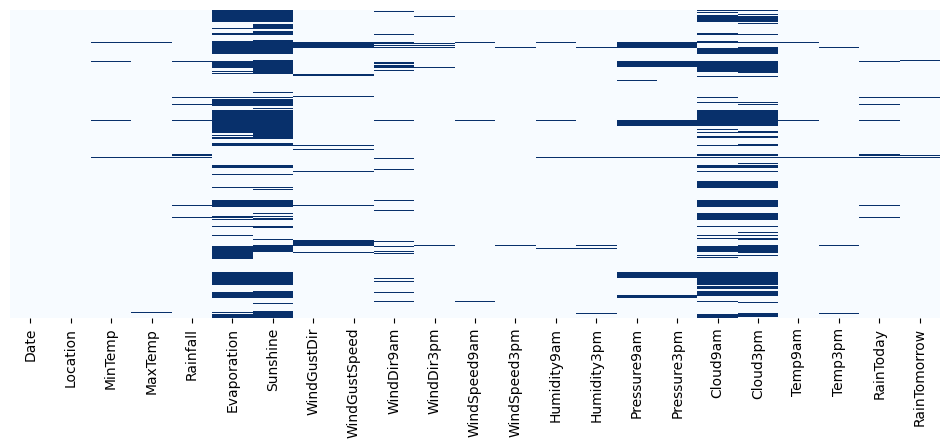

In [35]:
fig,ax = plt.subplots(1,1,figsize=(12,4))
sns.heatmap(df.isnull(), yticklabels=False, cbar=False, cmap='Blues', ax=ax)

Heatmap akan memvisualisasikan setiap sel dalam DataFrame yang terdapat nilai yang hilang

## Visualisasi Missing Values

<Axes: >

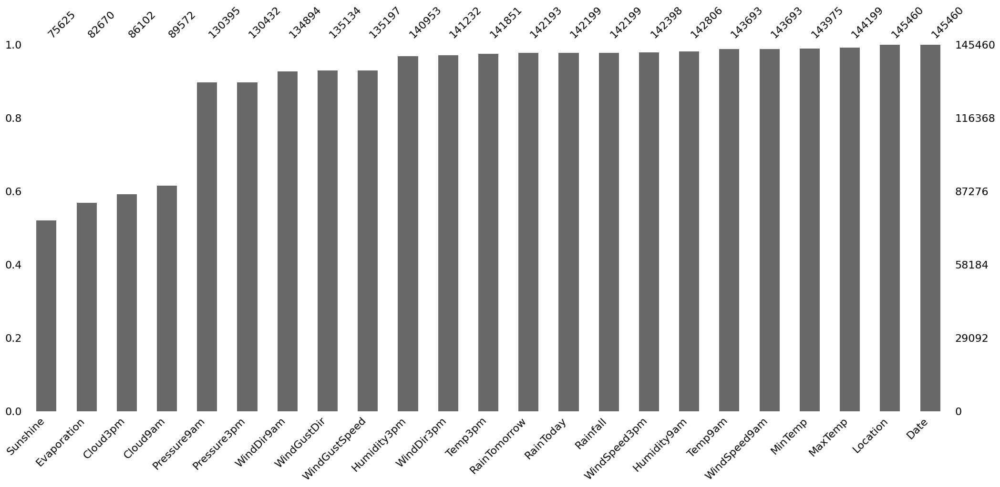

In [36]:
import missingno as msno
msno.bar(df, sort='ascending')

Grafik di atas menunjukkan bahwa jumlah nilai yang hilang yaitu : Sunshine, Evaporation, Cloud3pm dan Cloud9am

In [37]:
# Mengubah nilai pada dua kolom DataFrame yaitu 'RainToday' dan 'RainTomorrow', dari string 'Yes' dan 'No' menjadi bilangan biner (1 untuk 'Yes' dan 0 untuk 'No')
df['RainTomorrow'] = df['RainTomorrow'].map({'Yes': 1, 'No': 0})
df['RainToday'] = df['RainToday'].map({'Yes': 1, 'No': 0})

print(df.RainToday)
print(df.RainTomorrow)

0         0
1         0
2         0
3         0
4         0
         ..
145455    0
145456    0
145457    0
145458    0
145459    0
Name: RainToday, Length: 145460, dtype: category
Categories (2, int64): [0, 1]
0           0
1           0
2           0
3           0
4           0
         ... 
145455      0
145456      0
145457      0
145458      0
145459    NaN
Name: RainTomorrow, Length: 145460, dtype: category
Categories (2, int64): [0, 1]


In [38]:
# Menghitung persentase dari jumlah nilai yang hilang (missing values) pada setiap kolom DataFrame 
(df.isnull().sum()/len(df))*100

Date              0.000000
Location          0.000000
MinTemp           1.020899
MaxTemp           0.866905
Rainfall          2.241853
Evaporation      43.166506
Sunshine         48.009762
WindGustDir       7.098859
WindGustSpeed     7.055548
WindDir9am        7.263853
WindDir3pm        2.906641
WindSpeed9am      1.214767
WindSpeed3pm      2.105046
Humidity9am       1.824557
Humidity3pm       3.098446
Pressure9am      10.356799
Pressure3pm      10.331363
Cloud9am         38.421559
Cloud3pm         40.807095
Temp9am           1.214767
Temp3pm           2.481094
RainToday         2.241853
RainTomorrow      2.245978
dtype: float64

In [39]:
# Imputasi dataset dengan menggunakan nilai rata-rata.
df['MinTemp']=df['MinTemp'].fillna(df['MinTemp'].mean())
df['MaxTemp']=df['MaxTemp'].fillna(df['MaxTemp'].mean())
df['Rainfall']=df['Rainfall'].fillna(df['Rainfall'].mean())
df['Evaporation']=df['Evaporation'].fillna(df['Evaporation'].mean())
df['Sunshine']=df['Sunshine'].fillna(df['Sunshine'].mean())
df['WindGustSpeed']=df['WindGustSpeed'].fillna(df['WindGustSpeed'].mean())
df['WindSpeed9am']=df['WindSpeed9am'].fillna(df['WindSpeed9am'].mean())
df['WindSpeed3pm']=df['WindSpeed3pm'].fillna(df['WindSpeed3pm'].mean())
df['Humidity9am']=df['Humidity9am'].fillna(df['Humidity9am'].mean())
df['Humidity3pm']=df['Humidity3pm'].fillna(df['Humidity3pm'].mean())
df['Pressure9am']=df['Pressure9am'].fillna(df['Pressure9am'].mean())
df['Pressure3pm']=df['Pressure3pm'].fillna(df['Pressure3pm'].mean())
df['Cloud9am']=df['Cloud9am'].fillna(df['Cloud9am'].mean())
df['Cloud3pm']=df['Cloud3pm'].fillna(df['Cloud3pm'].mean())
df['Temp9am']=df['Temp9am'].fillna(df['Temp9am'].mean())
df['Temp3pm']=df['Temp3pm'].fillna(df['Temp3pm'].mean())

In [40]:
# Imputasi dataset dengan menggunakan mode
df['RainToday']=df['RainToday'].fillna(df['RainToday'].mode()[0])
df['RainTomorrow']=df['RainTomorrow'].fillna(df['RainTomorrow'].mode()[0])

In [41]:
# Imputasi dataset menggunakan mode
df['WindDir9am'] = df['WindDir9am'].fillna(df['WindDir9am'].mode()[0])
df['WindGustDir'] = df['WindGustDir'].fillna(df['WindGustDir'].mode()[0])
df['WindDir3pm'] = df['WindDir3pm'].fillna(df['WindDir3pm'].mode()[0])

In [42]:
(df.isnull().sum()/len(df))*100

Date             0.0
Location         0.0
MinTemp          0.0
MaxTemp          0.0
Rainfall         0.0
Evaporation      0.0
Sunshine         0.0
WindGustDir      0.0
WindGustSpeed    0.0
WindDir9am       0.0
WindDir3pm       0.0
WindSpeed9am     0.0
WindSpeed3pm     0.0
Humidity9am      0.0
Humidity3pm      0.0
Pressure9am      0.0
Pressure3pm      0.0
Cloud9am         0.0
Cloud3pm         0.0
Temp9am          0.0
Temp3pm          0.0
RainToday        0.0
RainTomorrow     0.0
dtype: float64

# Data Visualization

RainToday
0    113580
1     31880
Name: count, dtype: int64
RainTomorrow
0    113583
1     31877
Name: count, dtype: int64


<Axes: xlabel='RainTomorrow', ylabel='count'>

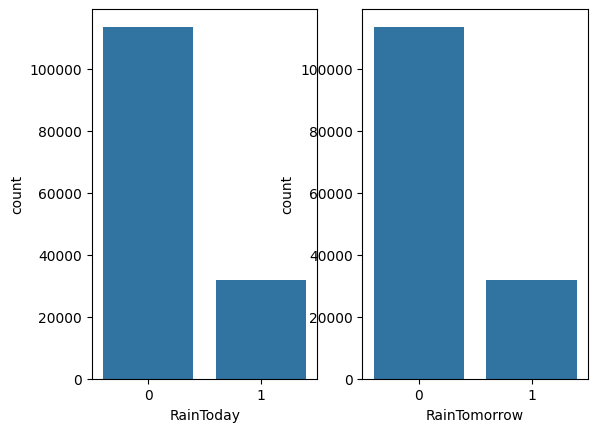

<Figure size 2000x3000 with 0 Axes>

In [43]:
# Mengidentifikasi jumlah hujan hari ini dan besok
fig, ax =plt.subplots(1,2)
print(df.RainToday.value_counts())
print(df.RainTomorrow.value_counts())

plt.figure(figsize=(20,30))
sns.countplot(data=df,x='RainToday',ax=ax[0])
sns.countplot(data=df,x='RainTomorrow',ax=ax[1])

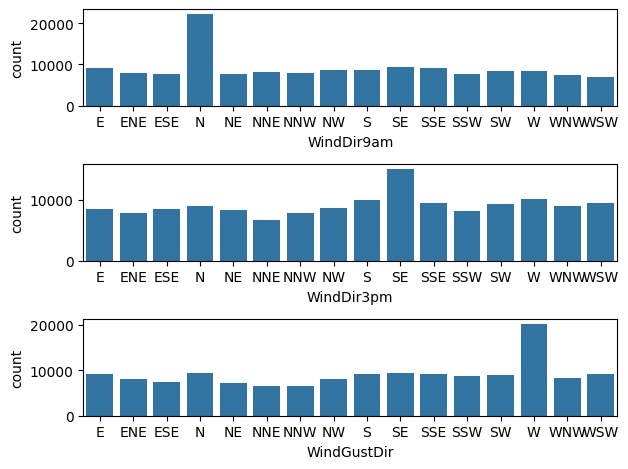

<Figure size 1000x1000 with 0 Axes>

In [44]:
# Mengidentifikasi arah angin jam 9 pagi, jam 3 sore
fig, ax =plt.subplots(3,1)
plt.figure(figsize=(10,10))

sns.countplot(data=df,x='WindDir9am',ax=ax[0])
sns.countplot(data=df,x='WindDir3pm',ax=ax[1])
sns.countplot(data=df,x='WindGustDir',ax=ax[2])
fig.tight_layout()

Pukul 9 pagi, paling tinggi yaitu arah N

Pukul 3 sore, paling tinggi yaitu arah SE

In [45]:
import plotly.express as px

In [46]:
print("Unique locations and their counts :")
location = df["Location"].value_counts()
location = location.reset_index()
location.columns= ["Location", "Counts"]
print(location)

Unique locations and their counts :
            Location  Counts
0           Canberra    3436
1             Sydney    3344
2           Adelaide    3193
3          Melbourne    3193
4              Perth    3193
5             Hobart    3193
6           Brisbane    3193
7             Darwin    3193
8             Albany    3040
9         Launceston    3040
10         GoldCoast    3040
11        Townsville    3040
12      MountGambier    3040
13            Cairns    3040
14           Bendigo    3040
15          Ballarat    3040
16        Wollongong    3040
17      AliceSprings    3040
18            Albury    3040
19       MountGinini    3040
20       Tuggeranong    3039
21           Penrith    3039
22         Newcastle    3039
23             Moree    3009
24              Sale    3009
25     BadgerysCreek    3009
26       Witchcliffe    3009
27       Williamtown    3009
28          Watsonia    3009
29        WaggaWagga    3009
30             Cobar    3009
31      CoffsHarbour    3009
32     

In [47]:
fig = px.treemap(location, path=['Location'], values='Counts', color='Counts', title="Tngkat hujan dari yang tertinggi ke terendah")
fig.show()

C:\Users\VITO\AppData\Local\Programs\Python\Python311\Lib\site-packages\plotly\express\_core.py:1699: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [48]:
fig = px.histogram(df, x="Rainfall", title="Curah hujan (mm)", color_discrete_sequence=["blue"], nbins=25)
fig.show()

In [49]:
fig = px.histogram(df, x="Evaporation", title="Evaporation(mm)", color_discrete_sequence=["blue"])
fig.show()

In [50]:
print("Unique wind gust directions and their counts :")
windgustdir = df["WindGustDir"].value_counts()
windgustdir = windgustdir.reset_index()
windgustdir.columns= ["Wind Gust Direction", "Counts"]
print(windgustdir)

Unique wind gust directions and their counts :
   Wind Gust Direction  Counts
0                    W   20241
1                   SE    9418
2                    N    9313
3                  SSE    9216
4                    E    9181
5                    S    9168
6                  WSW    9069
7                   SW    8967
8                  SSW    8736
9                  WNW    8252
10                  NW    8122
11                 ENE    8104
12                 ESE    7372
13                  NE    7133
14                 NNW    6620
15                 NNE    6548


In [51]:
fig = px.bar(windgustdir, x="Wind Gust Direction", y="Counts", title="Arah hembusan angin berdasarkan yang tertinggi hingga terendah", color="Counts")
fig.show()

In [52]:
print("Unique wind gust speed in km/hr and their counts :")
windgustspd = df["WindGustSpeed"].value_counts()
windgustspd = windgustspd.reset_index()
windgustspd.columns= ["Wind Gust Speed", "Counts"]
print(windgustspd)

Unique wind gust speed in km/hr and their counts :
    Wind Gust Speed  Counts
0          40.03523   10263
1          35.00000    9215
2          39.00000    8794
3          31.00000    8428
4          37.00000    8047
..              ...     ...
63        122.00000       3
64        126.00000       2
65        124.00000       2
66        130.00000       1
67          6.00000       1

[68 rows x 2 columns]


In [53]:
fig = px.bar(windgustspd, x="Wind Gust Speed", y="Counts", title= "Kecepatan arah angin (Km/Jam) berdasarkan yang tertinggi Ke terendah", color="Counts")
fig.show()

In [54]:
loctemp = df.groupby("Location")[["MinTemp", "MaxTemp"]].mean().round()
loctemp = loctemp.reset_index()
loctemp.columns= ["Location","MinTemp", "MaxTemp"]
print(loctemp)

            Location  MinTemp  MaxTemp
0           Adelaide     13.0     23.0
1             Albany     13.0     20.0
2             Albury     10.0     23.0
3       AliceSprings     13.0     29.0
4      BadgerysCreek     11.0     24.0
5           Ballarat      7.0     18.0
6            Bendigo      9.0     22.0
7           Brisbane     16.0     26.0
8             Cairns     21.0     30.0
9           Canberra      7.0     21.0
10             Cobar     13.0     26.0
11      CoffsHarbour     14.0     24.0
12          Dartmoor      9.0     20.0
13            Darwin     23.0     33.0
14         GoldCoast     17.0     26.0
15            Hobart      9.0     18.0
16         Katherine     20.0     35.0
17        Launceston      8.0     19.0
18         Melbourne     12.0     21.0
19  MelbourneAirport     10.0     20.0
20           Mildura     11.0     25.0
21             Moree     13.0     27.0
22      MountGambier      9.0     20.0
23       MountGinini      4.0     12.0
24         Newcastle     

C:\Users\VITO\AppData\Local\Temp\ipykernel_16016\1189623050.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [55]:
fig = px.bar(loctemp, x="Location", y=["MinTemp", "MaxTemp"], title="Lokasi hujan berdasarkan rata-rata suhu minimum rata-rata dan suhu maksimum")
fig.show()

In [56]:
fig = px.histogram(df, x='Location', title='RainToday', color='RainToday')
fig.show()

C:\Users\VITO\AppData\Local\Programs\Python\Python311\Lib\site-packages\plotly\express\_core.py:2044: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [57]:
fig = px.histogram(df, x='Location', title='Rain Tomorrow', color='RainTomorrow')
fig.show()

C:\Users\VITO\AppData\Local\Programs\Python\Python311\Lib\site-packages\plotly\express\_core.py:2044: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [58]:
from IPython.core.display import display, HTML
display(HTML("<div class='tableauPlaceholder' id='viz1652712003286' style='position: relative'><noscript><a href='#'><img alt='RainFall Per Location ' src='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;Ra&#47;RainFallinLocations&#47;Sheet1&#47;1_rss.png' style='border: none' /></a></noscript><object class='tableauViz'  style='display:none;'><param name='host_url' value='https%3A%2F%2Fpublic.tableau.com%2F' /> <param name='embed_code_version' value='3' /> <param name='site_root' value='' /><param name='name' value='RainFallinLocations&#47;Sheet1' /><param name='tabs' value='no' /><param name='toolbar' value='yes' /><param name='static_image' value='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;Ra&#47;RainFallinLocations&#47;Sheet1&#47;1.png' /> <param name='animate_transition' value='yes' /><param name='display_static_image' value='yes' /><param name='display_spinner' value='yes' /><param name='display_overlay' value='yes' /><param name='display_count' value='yes' /><param name='language' value='en-US' /><param name='filter' value='publish=yes' /></object></div>                <script type='text/javascript'>                    var divElement = document.getElementById('viz1652712003286');                    var vizElement = divElement.getElementsByTagName('object')[0];                    vizElement.style.width='100%';vizElement.style.height=(divElement.offsetWidth*0.75)+'px';var scriptElement = document.createElement('script');scriptElement.src = 'https://public.tableau.com/javascripts/api/viz_v1.js'; vizElement.parentNode.insertBefore(scriptElement, vizElement); </script>"))

C:\Users\VITO\AppData\Local\Temp\ipykernel_16016\832404541.py:1: DeprecationWarning:

Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display



## Jumlah rata-rata curah hujan untuk setiap kota di Australia dan frekuensi setiap curah hujan

In [59]:
df['Date'] = pd.to_datetime(df['Date'])

In [60]:
df['Year'] = df['Date'].dt.year
df['Year'].head()

0    2008
1    2008
2    2008
3    2008
4    2008
Name: Year, dtype: int32

In [61]:
df['Month'] = df['Date'].dt.month
df['Month'].head()

0    12
1    12
2    12
3    12
4    12
Name: Month, dtype: int32

In [62]:
df['Day'] = df['Date'].dt.day
df['Day'].head()

0    1
1    2
2    3
3    4
4    5
Name: Day, dtype: int32

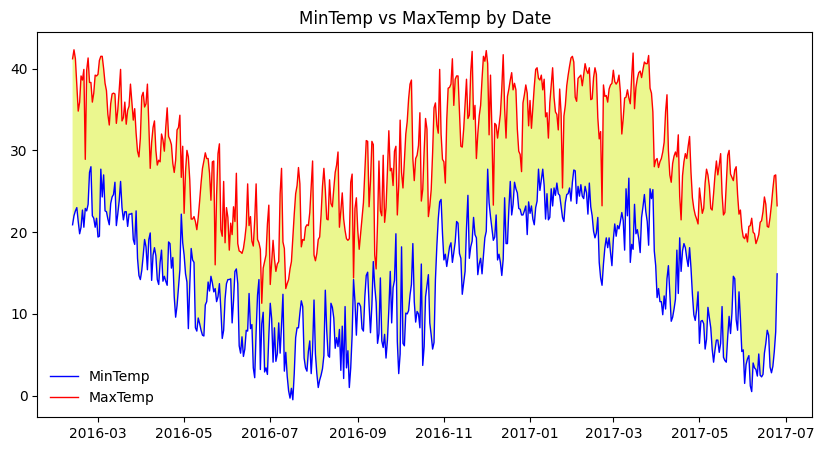

In [63]:
df_date = df.iloc[-500:,:]
plt.figure(figsize=[10,5])
plt.plot(df_date['Date'],df_date['MinTemp'],color='blue',linewidth=1, label= 'MinTemp')
plt.plot(df_date['Date'],df_date['MaxTemp'],color='red',linewidth=1, label= 'MaxTemp')
plt.fill_between(df_date['Date'],df_date['MinTemp'],df_date['MaxTemp'], facecolor = '#EBF78F')
plt.title('MinTemp vs MaxTemp by Date')
plt.legend(loc='lower left', frameon=False)
plt.show()

In [66]:
(df.isnull().sum()/len(df))*100

Date             0.0
Location         0.0
MinTemp          0.0
MaxTemp          0.0
Rainfall         0.0
Evaporation      0.0
Sunshine         0.0
WindGustDir      0.0
WindGustSpeed    0.0
WindDir9am       0.0
WindDir3pm       0.0
WindSpeed9am     0.0
WindSpeed3pm     0.0
Humidity9am      0.0
Humidity3pm      0.0
Pressure9am      0.0
Pressure3pm      0.0
Cloud9am         0.0
Cloud3pm         0.0
Temp9am          0.0
Temp3pm          0.0
RainToday        0.0
RainTomorrow     0.0
Year             0.0
Month            0.0
Day              0.0
dtype: float64

# Modelling

In [140]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression

In [99]:
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,2008-12-01,Albury,13.4,22.900000,0.6,5.468232,7.611178,W,44.00000,W,...,1007.1,8.000000,4.50993,16.9,21.8,0,0,2008,12,1
1,2008-12-02,Albury,7.4,25.100000,0.0,5.468232,7.611178,WNW,44.00000,NNW,...,1007.8,4.447461,4.50993,17.2,24.3,0,0,2008,12,2
2,2008-12-03,Albury,12.9,25.700000,0.0,5.468232,7.611178,WSW,46.00000,W,...,1008.7,4.447461,2.00000,21.0,23.2,0,0,2008,12,3
3,2008-12-04,Albury,9.2,28.000000,0.0,5.468232,7.611178,NE,24.00000,SE,...,1012.8,4.447461,4.50993,18.1,26.5,0,0,2008,12,4
4,2008-12-05,Albury,17.5,32.300000,1.0,5.468232,7.611178,W,41.00000,ENE,...,1006.0,7.000000,8.00000,17.8,29.7,0,0,2008,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145455,2017-06-21,Uluru,2.8,23.400000,0.0,5.468232,7.611178,E,31.00000,SE,...,1020.3,4.447461,4.50993,10.1,22.4,0,0,2017,6,21
145456,2017-06-22,Uluru,3.6,25.300000,0.0,5.468232,7.611178,NNW,22.00000,SE,...,1019.1,4.447461,4.50993,10.9,24.5,0,0,2017,6,22
145457,2017-06-23,Uluru,5.4,26.900000,0.0,5.468232,7.611178,N,37.00000,SE,...,1016.8,4.447461,4.50993,12.5,26.1,0,0,2017,6,23
145458,2017-06-24,Uluru,7.8,27.000000,0.0,5.468232,7.611178,SE,28.00000,SSE,...,1016.5,3.000000,2.00000,15.1,26.0,0,0,2017,6,24


In [100]:
df_final = df.copy()
df_final['Date'] = pd.to_datetime(df_final['Date']).apply(lambda x: x.timestamp())

Mengubah kolom kategorikal string menjadi kolom kategorikal dalam bentuk numerik

In [101]:
le = LabelEncoder()

disc_col = df_final.select_dtypes(include='category').columns

for col in disc_col:
  df_final[col] = le.fit_transform(df_final[col])

df_final

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,1.228090e+09,2,13.4,22.900000,0.6,5.468232,7.611178,13,44.00000,13,...,1007.1,8.000000,4.50993,16.9,21.8,0,0,2008,12,1
1,1.228176e+09,2,7.4,25.100000,0.0,5.468232,7.611178,14,44.00000,6,...,1007.8,4.447461,4.50993,17.2,24.3,0,0,2008,12,2
2,1.228262e+09,2,12.9,25.700000,0.0,5.468232,7.611178,15,46.00000,13,...,1008.7,4.447461,2.00000,21.0,23.2,0,0,2008,12,3
3,1.228349e+09,2,9.2,28.000000,0.0,5.468232,7.611178,4,24.00000,9,...,1012.8,4.447461,4.50993,18.1,26.5,0,0,2008,12,4
4,1.228435e+09,2,17.5,32.300000,1.0,5.468232,7.611178,13,41.00000,1,...,1006.0,7.000000,8.00000,17.8,29.7,0,0,2008,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145455,1.498003e+09,41,2.8,23.400000,0.0,5.468232,7.611178,0,31.00000,9,...,1020.3,4.447461,4.50993,10.1,22.4,0,0,2017,6,21
145456,1.498090e+09,41,3.6,25.300000,0.0,5.468232,7.611178,6,22.00000,9,...,1019.1,4.447461,4.50993,10.9,24.5,0,0,2017,6,22
145457,1.498176e+09,41,5.4,26.900000,0.0,5.468232,7.611178,3,37.00000,9,...,1016.8,4.447461,4.50993,12.5,26.1,0,0,2017,6,23
145458,1.498262e+09,41,7.8,27.000000,0.0,5.468232,7.611178,9,28.00000,10,...,1016.5,3.000000,2.00000,15.1,26.0,0,0,2017,6,24


### Check Outlier

In [161]:
def check_outlier(df):
    Q1 = df.quantile(0.25)
    Q3 = df.quantile(0.75)

    # Menghitung RUB dan RLB.
    IQR = Q3 - Q1
    lower_limit = Q1 - 1.5*IQR
    upper_limit = Q3 + 1.5*IQR

    # Menampilkan banyaknya outlier pada atribut.
    outliers = (df < lower_limit) | (df > upper_limit)
    print ("Outlier pada tiap atribut:")
    print(outliers.sum())
    print()
    total_data_points = df.shape[0]
    percentage_outliers = (outliers.sum() / total_data_points) * 100
    print(f"Persentase outlier dari keseluruhan dataset untuk tiap kolom:")
    print(percentage_outliers)

    return outliers

In [162]:
outliers = dict(check_outlier(df_final).sum())

Outlier pada tiap atribut:
Date                 0
Location             0
MinTemp             82
MaxTemp            544
Rainfall         23723
Evaporation      29631
Sunshine         45567
WindGustDir          0
WindGustSpeed     5523
WindDir9am           0
WindDir3pm           0
WindSpeed9am      1817
WindSpeed3pm      2523
Humidity9am       1425
Humidity3pm          0
Pressure9am       2758
Pressure3pm       2524
Cloud9am             0
Cloud3pm          4974
Temp9am            307
Temp3pm            988
RainToday        31880
RainTomorrow     31877
Year                 0
Month                0
Day                  0
dtype: int64

Persentase outlier dari keseluruhan dataset untuk tiap kolom:
Date              0.000000
Location          0.000000
MinTemp           0.056373
MaxTemp           0.373986
Rainfall         16.308951
Evaporation      20.370549
Sunshine         31.326138
WindGustDir       0.000000
WindGustSpeed     3.796920
WindDir9am        0.000000
WindDir3pm        0.000000
Wi

Terlihat bahwa terdapat outlier pada kolom numerik Rainfall, Evaporation, dan Sunshine.
Dengan demikian, pada KNN kita dapat menggunakan n_neighbors yang besar agar menghindari data bergabung dengan outlier

Menyiapkan train dan test dengan train 75% dan test 25%

In [102]:
X = df_final.drop(columns='RainTomorrow')
y = df_final.RainTomorrow

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

print('Train size:', X_train.shape[0])
print('Test size: ', X_test.shape[0])

Train size: 109095
Test size:  36365


Fungsi untuk mengukur metrik evaluasi

In [123]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix, roc_curve, auc, roc_auc_score

# Function to plot Confusion Matrix
def plot_confusion_matrix(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Confusion Matrix')
    plt.show()

# Function to plot ROC Curve
def plot_roc_curve_custom(model, X_test, y_test):
    y_probs = model.predict_proba(X_test)[:, 1]
    fpr, tpr, thresholds = roc_curve(y_test, y_probs)
    auc_score = auc(fpr, tpr)

    plt.plot(fpr, tpr, label=f'AUC = {auc_score:.2f}')
    plt.plot([0, 1], [0, 1], color='black', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend()
    plt.show()

# Function to evaluate and visualize
def evaluate(model, y_pred, X_train=X_train, X_test=X_test, y_train=y_train, y_test=y_test):
    # Confusion Matrix
    print('Confusion Matrix')
    print('-'*53)
    plot_confusion_matrix(y_test, y_pred)
    print('\n') 
    
    # Classification Report
    print('Classification Report') 
    print('-'*53)
    print(classification_report(y_test, y_pred))
    print('\n')
    
    # ROC Curve
    print('ROC Curve')
    print('-'*53)
    plot_roc_curve_custom(model, X_test, y_test)
    print('\n')
    
    # Checking model fitness
    print('Checking model fitness') 
    print('-'*53)
    print('Train score:', round(model.score(X_train, y_train), 4))
    print('Test score: ', round(model.score(X_test, y_test), 4))
    print('\n')

## KNN

Sesuai dengan namanya (<i>nearest neighbors</i>), algoritma ini mengklasifikasikan suatu data baru dengan melihat kedekatan data tersebut terhadap data lama yang lainnya. Contoh, kamu mempunyai dataset yang berisi informasi rumah dengan label rumah mewah dan rumah tidak mewah. KNN akan menyimpan informasi mengenai ukuran yang serupa, seperti kemiripan luas rumah dan juga harga rumah. Ketika data rumah baru masuk, KNN akan mengecek kesamaan informasi data rumah tersebut terhadap data lama yang telah dipelajari KNN. Hasil pengecekan akan dijadikan sebagai kesimpulan rumah baru tersebut masuk ke dalam klasifikasi yang mana.

Apa saja yang perlu kita perhatikan sebelum mengimplementasikan KNN?
* <b>Jumlah K</b> <br>
Jumlah K sangat menentukan performa KNN. K merepresentasikan jumlah data point terdekat, yang akan digunakan untuk menentukan suatu data point masuk ke dalam kategori apa. K yang kecil sangat rentan dengan <i>noise</i> yang dapat membuat model overfitting, sedangkan K yang besar dapat merusak aspek <i>lokalitas</i> yang berujung ke penurunan performa model klasifikasi.<br>


* <b>Rumus Jarak yang digunakan</b> <br>
Rumus jarak yang digunakan untuk menghitung kedekatan data point terhadap data yang lainnya juga sangat menentukan performa dari algoritma KNN. Jika perhitungan jarak yang digunakan kurang sesuai, maka kalkulasi similarity akan tidak tepat dan berujung membuat klasifikasi menjadi tidak sesuai

Pada scikit-learn, ada beberapa parameter yang perlu kita perhatikan, berikut adalah rangkuman singkatnya.

* `n_neighbor` <br>
n_neighbor merepresentasikan jumlah K yang kita gunakan, dengan default nilai adalah 5 <br>
* `algorithm` <br>
parameter algorithm merepresentasikan algoritma yang digunakan dalam mencari tetangga terdekat. Algoritma yang tersedia adalah, ball tree, kd tree, brute force, dan auto. Default nilai dari parameter ini adalah auto <br>
* `p` <br>
parameter ini merepresentasikan parameter yang digunakan untuk metric. Jika menggunakan minkowski, maka p bernilai 1 digunakan untuk manhattan distance dan p bernilai 2 untuk euclidean distance. Default dari parameter ini adalah 2, yaitu euclidean distance <br>
* `metric` <br>
parameter ini digunakan untuk menentukan rumus jarak yang dipakai. Default dari nilai ini adalah minkowski. <br>

In [106]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [107]:
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

#### Pembuatan Model KNN

In [113]:
knn_model = KNeighborsClassifier(n_neighbors=5)  # You can adjust the number of neighbors
knn_model.fit(X_train_scaled, y_train)
y_pred = knn_model.predict(X_test_scaled)

Confusion Matrix
-----------------------------------------------------


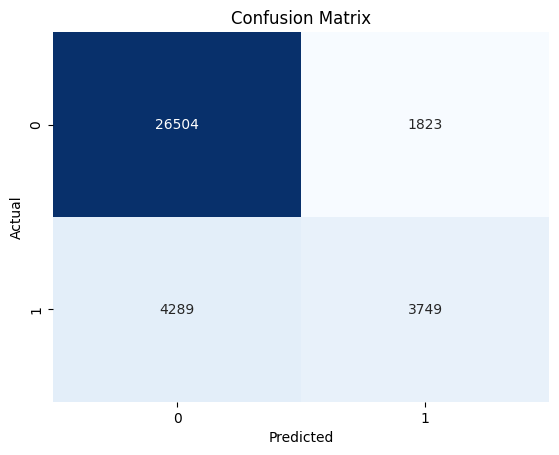



Classification Report
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.86      0.94      0.90     28327
           1       0.67      0.47      0.55      8038

    accuracy                           0.83     36365
   macro avg       0.77      0.70      0.72     36365
weighted avg       0.82      0.83      0.82     36365



ROC Curve
-----------------------------------------------------


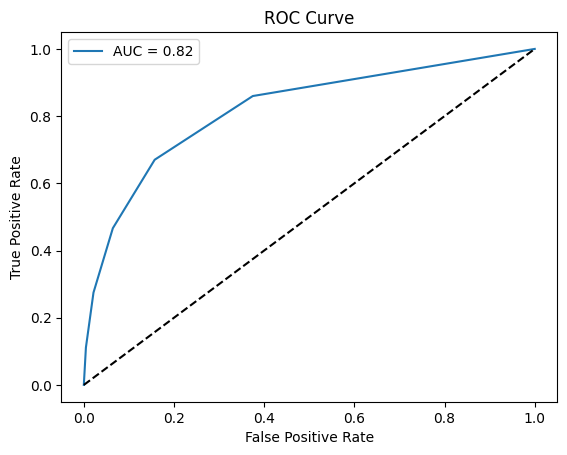



Checking model fitness
-----------------------------------------------------
Train score: 0.8805
Test score:  0.8319




In [124]:
evaluate(knn_model, X_train=X_train_scaled, X_test=X_test_scaled, y_train=y_train, y_test=y_test, y_pred=y_pred)

In [132]:
cv_scores = cross_val_score(knn_model, X_train_scaled, y_train, cv=5)
print(cv_scores)
print(f"Rata-rata skor CV: {cv_scores.mean()}")

[0.83491452 0.83404372 0.83078968 0.83463953 0.83422705]
Rata-rata skor CV: 0.8337229020578395


#### Optimisasi Model KNN

In [134]:
param_grid = {
    'n_neighbors': [3, 5, 7, 9],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan']
}

knn_model = KNeighborsClassifier()
grid_search = GridSearchCV(knn_model, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train_scaled, y_train)

best_params = grid_search.best_params_
best_estimator = grid_search.best_estimator_
print("Best Parameters:", best_params)

Best Parameters: {'metric': 'manhattan', 'n_neighbors': 9, 'weights': 'distance'}


In [137]:
cv_scores = cross_val_score(best_estimator, X_train_scaled, y_train, cv=5)
print(cv_scores)
print(f"Rata-rata skor CV: {cv_scores.mean()}")

[0.84774738 0.84614327 0.84165177 0.84683074 0.84440167]
Rata-rata skor CV: 0.845354965855447


In [135]:
y_pred_best = best_estimator.predict(X_test_scaled)

Confusion Matrix
-----------------------------------------------------


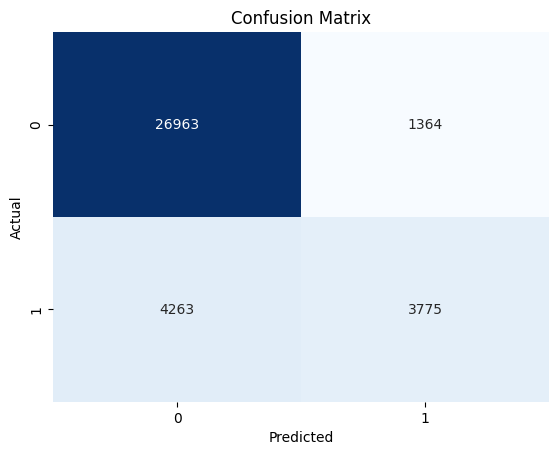



Classification Report
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.86      0.95      0.91     28327
           1       0.73      0.47      0.57      8038

    accuracy                           0.85     36365
   macro avg       0.80      0.71      0.74     36365
weighted avg       0.83      0.85      0.83     36365



ROC Curve
-----------------------------------------------------


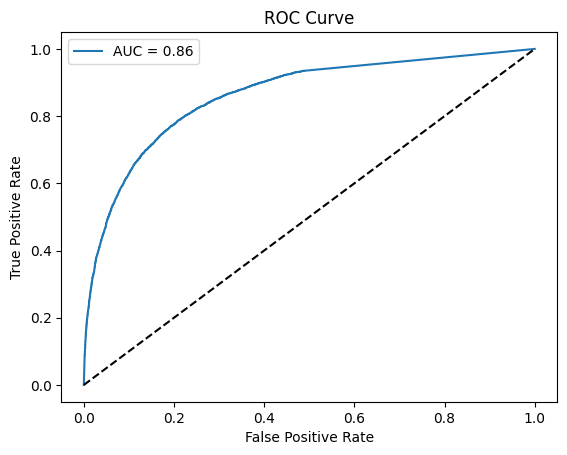



Checking model fitness
-----------------------------------------------------
Train score: 1.0
Test score:  0.8453




In [138]:
evaluate(best_estimator, X_train=X_train_scaled, X_test=X_test_scaled, y_train=y_train, y_test=y_test, y_pred=y_pred_best)

#### Analisis KNN

Dokumen ini memberikan analisis perbandingan hasil klasifikasi sebelum dan setelah dioptimisasi menggunakan algoritma K-Nearest Neighbors (KNN).

Sebelum Dioptimisasi dengan KNN:

- **Akurasi Model:** Sekitar 83%, dengan precision lebih tinggi untuk kelas 0 (kelas mayoritas) daripada kelas 1.
- **Recall Kelas 1:** Rendah, menunjukkan kesulitan model dalam mengidentifikasi instance kelas 1.
- **F1-score Kelas 1:** Relatif rendah, menunjukkan keseimbangan yang kurang baik antara precision dan recall untuk kelas tersebut.
- **Train score dan test score:** Tidak ada perbedaan signifikan, menunjukkan model tidak terlalu overfit atau underfit pada data pelatihan dan pengujian.
- **Rata-rata skor cross-validation (CV):** Sekitar 0.83, mendukung hasil dari train dan test score.

Setelah Dioptimisasi dengan KNN:

- **Akurasi Model:** Sekitar 85%, dengan precision dan recall yang lebih baik untuk kelas 1.
- **Recall Kelas 1:** Meningkat, menunjukkan model dioptimisasi lebih baik dalam mengidentifikasi instance kelas 1.
- **F1-score Kelas 1:** Meningkat, menunjukkan keseimbangan antara precision dan recall untuk kelas 1 menjadi lebih baik.
- **Train score:** Mencapai 1.0, menunjukkan model dapat dengan sempurna memahami data pelatihan.
- **Test score dan rata-rata skor cross-validation:** Meningkat, menunjukkan model dioptimisasi lebih baik dalam melakukan generalisasi pada data yang belum pernah dilihat sebelumnya.

Kesimpulan Umum:

- Optimisasi dengan KNN berhasil meningkatkan performa model, khususnya dalam mengenali kelas minoritas.
- Peningkatan pada train score dan akurasi pada data pengujian menunjukkan bahwa model yang dioptimisasi lebih cocok untuk data.
- Perlu memastikan bahwa peningkatan performa tidak disebabkan oleh overfitting pada data pelatihan.
- Meskipun terjadi peningkatan, masih perlu mempertimbangkan keseimbangan antara precision dan recall terutama untuk kelas minoritas.


## Logistic Regression

Logistic Regression adalah metode statistik untuk menganalisis dataset di mana terdapat satu atau lebih variabel independen yang memprediksi suatu hasil. Ini adalah jenis analisis regresi yang umum digunakan untuk memprediksi probabilitas terjadinya suatu peristiwa dengan menyesuaikan data ke kurva logistik.

Key Concept

- **Klasifikasi Biner:** Regresi Logistik cocok digunakan untuk masalah klasifikasi biner di mana variabel target memiliki dua hasil yang mungkin (0 atau 1, True atau False, Ya atau Tidak).
- **Fungsi Sigmoid:** Regresi Logistik menggunakan fungsi sigmoid untuk memodelkan probabilitas bahwa suatu instansi tertentu termasuk dalam kategori tertentu. Fungsi sigmoid menghasilkan nilai antara 0 dan 1, mewakili probabilitas.
- **Batas Keputusan:** Model menentukan batas keputusan berdasarkan fitur input, mengklasifikasikan instansi di satu sisi sebagai positif dan di sisi lain sebagai negatif.

Logistic regression adalah model linear yang hanya memiliki dua nilai output: 0 atau 1. Oleh karena itu logistic regression lebih cocok dianggap sebagai classifier daripada regressor. Contoh visualisasinya adalah sebagai berikut.

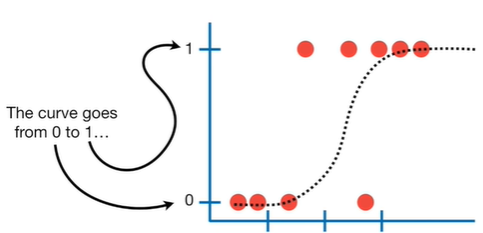

Sumber: https://youtu.be/yIYKR4sgzI8?t=222

Untuk mendapatkan kurva seperti pada gambar, berikut adalah persamaan logistic regression yang memenuhi.

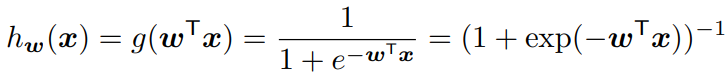

Berbeda dengan model linear regression yang meminimalkan fungsi loss. Pada logistic regression dilakukan proses memaksimalkan fungsi likelihood untuk menemukan parameter yang cocok dengan data.

Hal ini karena logistic regression merupakan metode klasifikasi. Sehingga, alih-alih meminimalkan perbedaan hasil prediksi, di sini memaksimalkan persamaan hasil prediksi dengan aktual. 

Fungsi/persamaan likelihood dimaksimalkan melalui proses yang disebut dengan gradient ascent (tentunya bisa dipelajari sendiri dari slide :D). Berikut adalah persamaan likelihood tersebut.

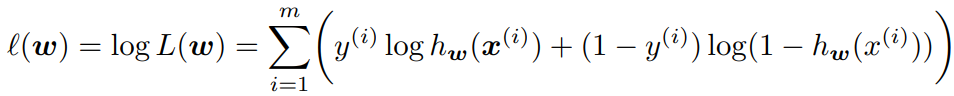


#### Pembuatan Model Logistic Regression

In [141]:
logreg_model = LogisticRegression()
logreg_model.fit(X_train_scaled, y_train)
y_pred = logreg_model.predict(X_test_scaled)

Confusion Matrix
-----------------------------------------------------


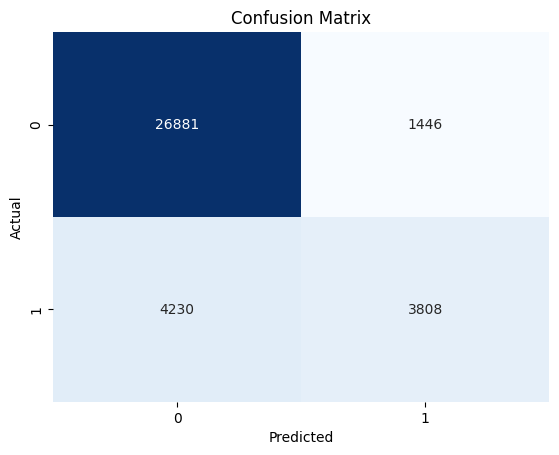



Classification Report
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.86      0.95      0.90     28327
           1       0.72      0.47      0.57      8038

    accuracy                           0.84     36365
   macro avg       0.79      0.71      0.74     36365
weighted avg       0.83      0.84      0.83     36365



ROC Curve
-----------------------------------------------------


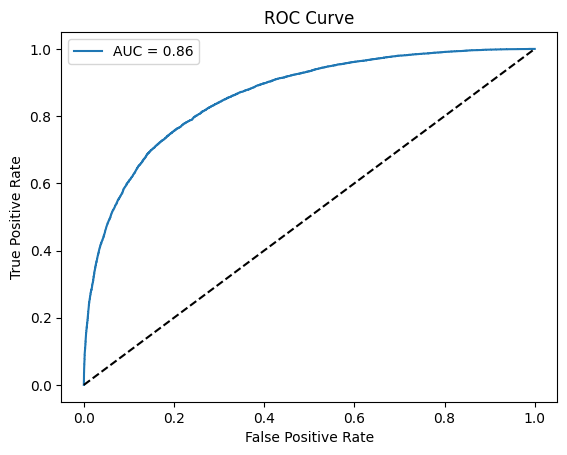



Checking model fitness
-----------------------------------------------------
Train score: 0.8437
Test score:  0.8439




In [142]:
evaluate(logreg_model, X_train=X_train_scaled, X_test=X_test_scaled, y_train=y_train, y_test=y_test, y_pred=y_pred)

In [152]:
cv_scores = cross_val_score(logreg_model, X_train_scaled, y_train, cv=5)
print(cv_scores)
print(f"Rata-rata skor CV: {cv_scores.mean()}")

[0.84476832 0.84298089 0.84252257 0.84394335 0.84334754]
Rata-rata skor CV: 0.8435125349466063


#### Optimisasi Model Logistic Regression

In [153]:
param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],  # Regularization parameter
    'penalty': ['l2'],  # Penalty term
}

logreg_model = LogisticRegression(solver='lbfgs')
grid_search = GridSearchCV(logreg_model, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train_scaled, y_train)

best_params = grid_search.best_params_
best_estimator = grid_search.best_estimator_
print("Best Parameters:", best_params)

Best Parameters: {'C': 1, 'penalty': 'l2'}


Confusion Matrix
-----------------------------------------------------


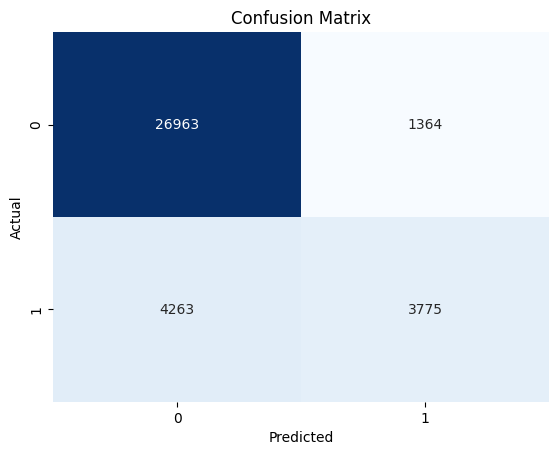



Classification Report
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.86      0.95      0.91     28327
           1       0.73      0.47      0.57      8038

    accuracy                           0.85     36365
   macro avg       0.80      0.71      0.74     36365
weighted avg       0.83      0.85      0.83     36365



ROC Curve
-----------------------------------------------------


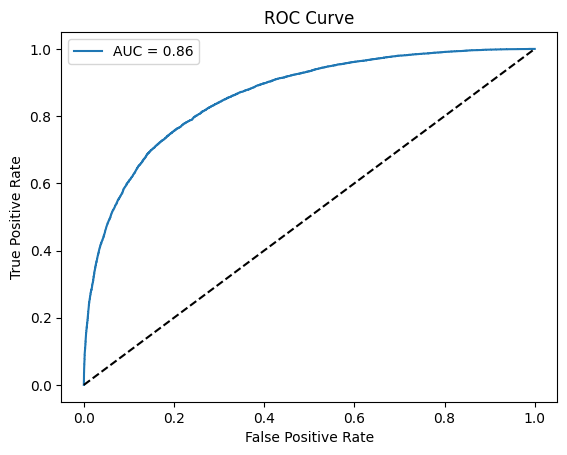



Checking model fitness
-----------------------------------------------------
Train score: 0.8437
Test score:  0.8439




In [154]:
evaluate(best_estimator, X_train=X_train_scaled, X_test=X_test_scaled, y_train=y_train, y_test=y_test, y_pred=y_pred_best)

In [151]:
cv_scores = cross_val_score(best_estimator, X_train_scaled, y_train, cv=5)
print(cv_scores)
print(f"Rata-rata skor CV: {cv_scores.mean()}")

[0.84476832 0.84298089 0.84252257 0.84394335 0.84334754]
Rata-rata skor CV: 0.8435125349466063


#### Analisis Logistic Regression

Sebelum Optimisasi

- **Classification Report:**
  - Precision for class 0: 0.86, class 1: 0.72
  - Recall for class 0: 0.95, class 1: 0.47
  - F1-score for class 0: 0.90, class 1: 0.57
  - Accuracy: 0.84
- **Checking Model Fitness:**
  - Train Score: 0.8437
  - Test Score: 0.8439
  - Rata-rata Skor Cross-Validation: 0.8435

Setelah Optimisasi

- **Classification Report:**
  - Precision for class 0: 0.86, class 1: 0.73
  - Recall for class 0: 0.95, class 1: 0.47
  - F1-score for class 0: 0.91, class 1: 0.57
  - Accuracy: 0.85
- **Checking Model Fitness:**
  - Train Score: 0.8437
  - Test Score: 0.8439
  - Rata-rata Skor Cross-Validation: 0.8435

Kesimpulan

1. Setelah optimisasi, terjadi peningkatan pada beberapa metrik kinerja model, terutama pada F1-score untuk kelas 0.
2. Meskipun terdapat peningkatan, performa model secara keseluruhan tetap relatif stabil.
3. Evaluasi model menggunakan train score, test score, dan cross-validation score menunjukkan konsistensi hasil.
4. Perlu dipertimbangkan untuk eksplorasi metode atau model lainnya guna meningkatkan performa lebih lanjut.
